In [1367]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import seaborn.objects as so
import plotly.graph_objects as go 
import warnings 
warnings.filterwarnings('ignore') 
import os
import plotly.express as px
import geopandas as gpd


In [1368]:
#load the data
df = pd.read_csv('openaqf.csv', sep=';', on_bad_lines='skip')


In [1369]:
#data prepeartion dates and coordinate
df[['Latitude', 'Longitude']] = df['Coordinates'].str.split(', ', expand=True).astype(float)
df['Last Updated'] = pd.to_datetime(df['Last Updated'], errors='coerce', utc=True)
df['Last Updated'] = pd.to_datetime(df['Last Updated'])
df['Year'] = df['Last Updated'].dt.year
df['Month'] = df['Last Updated'].dt.month
df['Day'] = df['Last Updated'].dt.day
df['Hour'] = df['Last Updated'].dt.hour
df['Date'] = df['Last Updated'].map(lambda x: x.strftime('%Y-%m-%d'))


In [1370]:
# Dictionary to convert ppm to µg/m3 

dict_conv = {'CO': 1150,
             'NO': 1230,
             'NO2': 1880,
             'O3': 1960,
             'SO2': 2620,
             'NOX': 1880}

df.loc[df['Unit']=='ppm', 'Conversion'] = df.loc[df['Unit']=='ppm', 'Pollutant'].map(dict_conv)
df.loc[df['Unit']=='ppm', 'Value_standard'] = df.loc[df['Unit']=='ppm', 'Conversion'] * df.loc[df['Unit']=='ppm', 'Value']
df.loc[df['Unit']=='µg/m³', 'Value_standard'] = df.loc[df['Unit']=='µg/m³', 'Value']

In [1371]:
#Quality measure
pol_levels_good = {'CO': 4,
                   'NO2': 25,
                   'O3': 100,
                   'SO2': 40,
                   'PM2.5': 15,
                   'PM10': 45}

pol_levels_bad =  {'CO': 7,
                   'NO2': 120,
                   'O3': 160,
                   'SO2': 125,
                   'PM2.5': 75,
                   'PM10': 150}

In [1372]:
#add Quality to df
df.loc[:, 'Good_threshold'] = df.loc[:, 'Pollutant'].map(pol_levels_good)
df.loc[:, 'Bad_threshold'] = df.loc[:, 'Pollutant'].map(pol_levels_bad)

df.loc[df['Value_standard']<=df['Good_threshold'], 'Quality'] = 'Good'
df.loc[df['Value_standard']>df['Bad_threshold'], 'Quality'] = 'Bad'
df.loc[(df['Value_standard']<=df['Bad_threshold'])
       & (df['Value_standard']>df['Good_threshold']), 'Quality'] = 'Regular'

In [1373]:
# Distinguish column types for tailored analysis
numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()

print(f"Numerical Columns: {numerical_cols}")
print(f"Categorical Columns: {categorical_cols}")

Numerical Columns: ['Value', 'Latitude', 'Longitude', 'Year', 'Month', 'Day', 'Hour', 'Conversion', 'Value_standard', 'Good_threshold', 'Bad_threshold']
Categorical Columns: ['Country Code', 'City', 'Location', 'Coordinates', 'Pollutant', 'Source Name', 'Unit', 'Last Updated', 'Country Label', 'Date', 'Quality']


In [1374]:
df.head()

,Country Code,City,Location,Coordinates,Pollutant,Source Name,Unit,Value,Last Updated,Country Label,...,Year,Month,Day,Hour,Date,Conversion,Value_standard,Good_threshold,Bad_threshold,Quality
0,IT,via Pecorelli - Civitavecchia (RM),Civitavecchia- Villa Albani,"42.09929600025972, 11.798339999946897",NO2,eea,µg/m³,34.00,2024-04-13 07:00:00+00:00,Italy,...,2024,4,13,7,2024-04-13,NaN,34.00,25.0,120.0,Regular
1,IT,Area industriale - Polla (SA),Polla Area tritovagliatore,"40.48700999991416, 15.528249999904329",SO2,eea,µg/m³,1.35,2024-04-13 07:00:00+00:00,Italy,...,2024,4,13,7,2024-04-13,NaN,1.35,40.0,125.0,Good
2,IT,via dei Normanni 90 - Acerra (NA),Acerra Zona Industriale,"40.979710000224664, 14.400999999874841",CO,eea,µg/m³,210.00,2024-03-11 10:00:00+00:00,Italy,...,2024,3,11,10,2024-03-11,NaN,210.00,4.0,7.0,Bad
3,IT,via Tagliamonte 18 - Torre Annunziata (NA),Torre Annunziata Scuola Media Pascoli,"40.760599999960604, 14.438150000027823",O3,eea,µg/m³,89.23,2024-04-13 07:00:00+00:00,Italy,...,2024,4,13,7,2024-04-13,NaN,89.23,100.0,160.0,Good
4,IT,via Epomeo - Napoli (NA),Tirrenopower Via Epomeo,"40.84495000021116, 14.205670000204075",PM10,eea,µg/m³,26.81,2024-04-13 07:00:00+00:00,Italy,...,2024,4,13,7,2024-04-13,NaN,26.81,45.0,150.0,Good


In [1375]:
df = df[df['Value_standard']>=0]

In [1376]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53590 entries, 0 to 55257
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   Country Code    53590 non-null  object             
 1   City            29766 non-null  object             
 2   Location        53588 non-null  object             
 3   Coordinates     53524 non-null  object             
 4   Pollutant       53590 non-null  object             
 5   Source Name     53590 non-null  object             
 6   Unit            53590 non-null  object             
 7   Value           53590 non-null  float64            
 8   Last Updated    53590 non-null  datetime64[ns, UTC]
 9   Country Label   53479 non-null  object             
 10  Latitude        53524 non-null  float64            
 11  Longitude       53524 non-null  float64            
 12  Year            53590 non-null  int64              
 13  Month           53590 non-null 

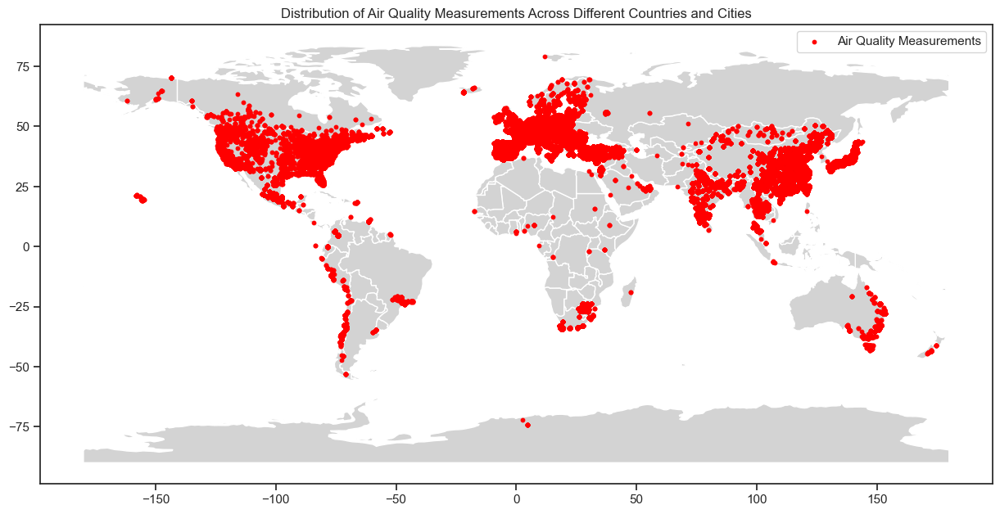

In [1377]:
# Creating a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))

# World basemap
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Plotting
fig, ax = plt.subplots(figsize=(15, 10))
world.plot(ax=ax, color='lightgrey')
gdf.plot(ax=ax, markersize=10, color='red', label='Air Quality Measurements')
plt.title('Distribution of Air Quality Measurements Across Different Countries and Cities')
plt.legend()
plt.show()

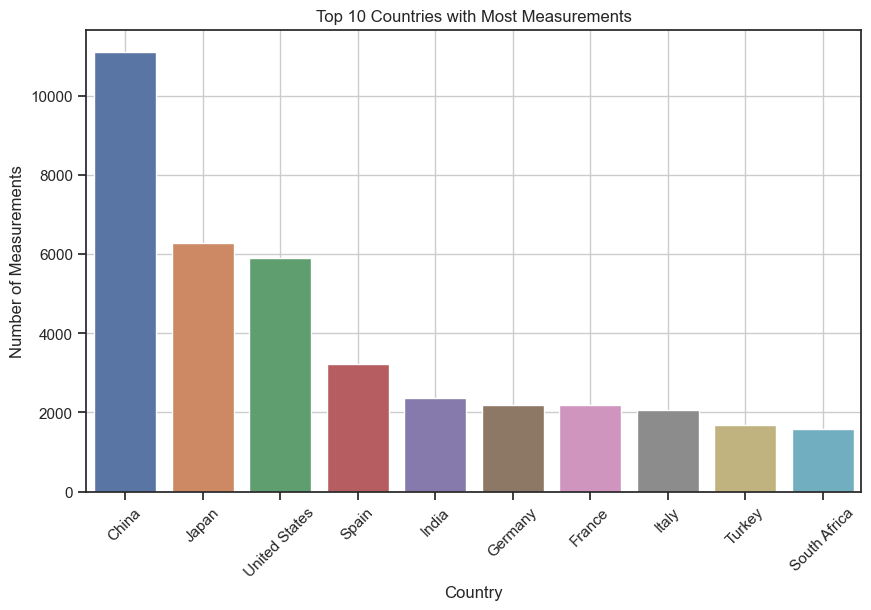

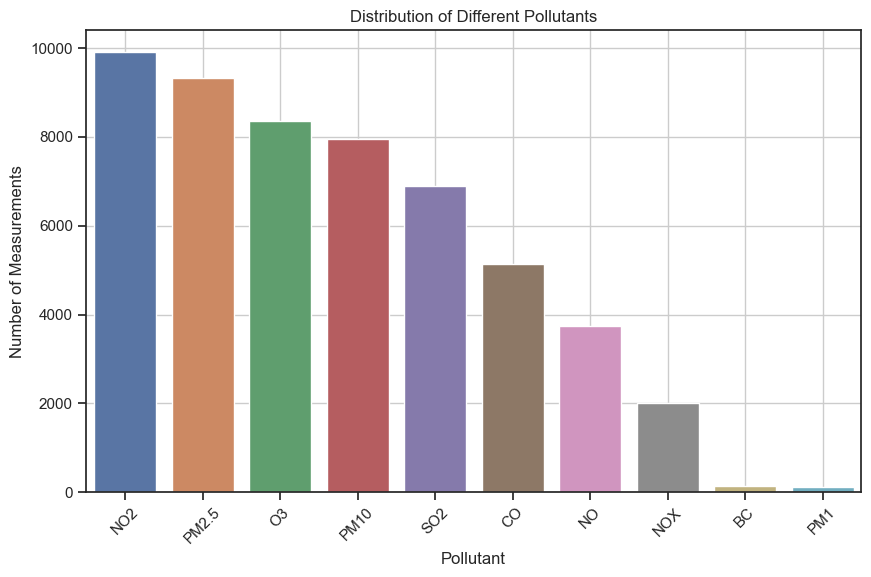

In [1378]:
plt.figure(figsize=(10, 6))
top_countries = df['Country Label'].value_counts().head(10)
sns.barplot(x=top_countries.index, y=top_countries.values)
plt.title('Top 10 Countries with Most Measurements')
plt.xlabel('Country')
plt.ylabel('Number of Measurements')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Pollutant Analysis: Distribution of different pollutants
plt.figure(figsize=(10, 6))
sns.countplot(x='Pollutant', data=df, order = df['Pollutant'].value_counts().index)
plt.title('Distribution of Different Pollutants')
plt.xlabel('Pollutant')
plt.ylabel('Number of Measurements')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

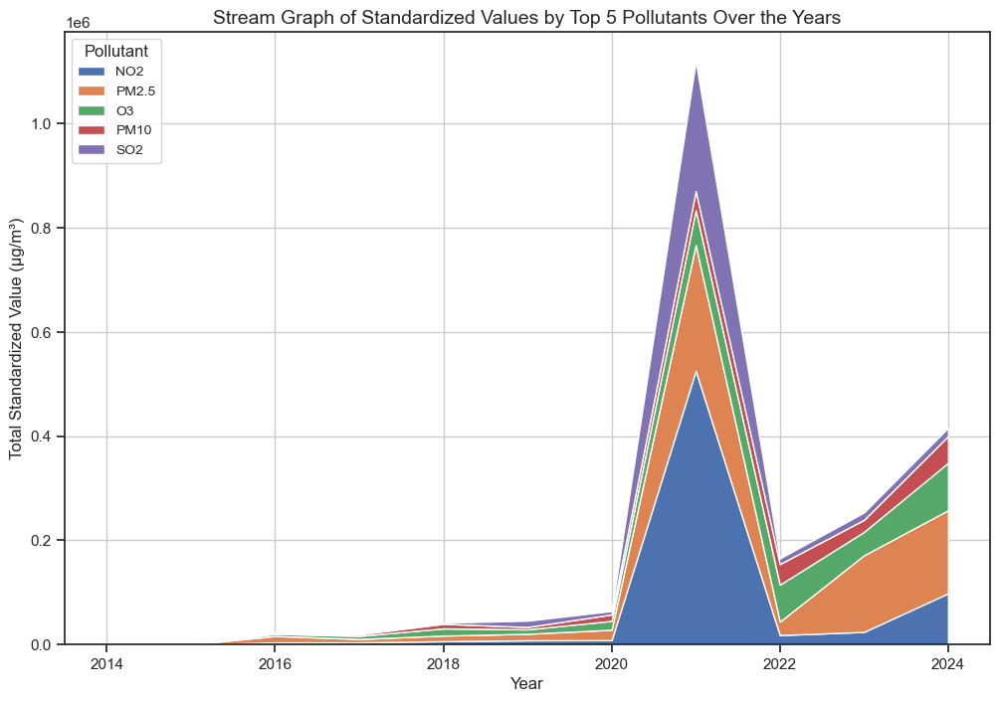

In [1379]:
pollutant_counts = df['Pollutant'].value_counts()
top_pollutants = pollutant_counts.nlargest(5).index
filtered_data = df[df['Pollutant'].isin(top_pollutants)]
grouped_data = filtered_data.groupby(['Year', 'Pollutant'])['Value_standard'].sum().reset_index()
pivot_data = grouped_data.pivot(index='Year', columns='Pollutant', values='Value_standard').fillna(0)
plt.figure(figsize=(12, 8))
plt.stackplot(pivot_data.index, pivot_data.values.T, labels=top_pollutants)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Standardized Value (µg/m³)', fontsize=12)
plt.title('Stream Graph of Standardized Values by Top 5 Pollutants Over the Years', fontsize=14)
plt.legend(title="Pollutant", title_fontsize='12', fontsize='10', loc='upper left')
plt.grid(True)
plt.show()


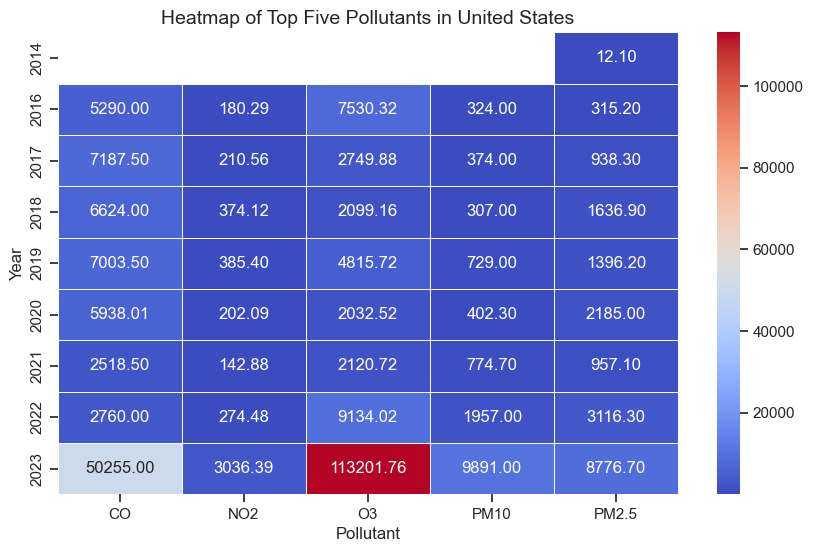

In [1380]:
country = 'United States'

country_data = df[df['Country Label'] == country]
grouped_data = country_data.groupby(['Year', 'Pollutant'])['Value_standard'].sum().reset_index()
top_pollutants = grouped_data.groupby('Pollutant')['Value_standard'].sum().nlargest(5).index
filtered_data = grouped_data[grouped_data['Pollutant'].isin(top_pollutants)]
heatmap_data = filtered_data.pivot(index='Year', columns='Pollutant', values='Value_standard')
heatmap_data = heatmap_data.dropna(axis=0, how='all')
heatmap_data = heatmap_data.dropna(axis=1, how='all')
plt.figure(figsize=(10, 6))
sns.heatmap(data=heatmap_data, cmap='coolwarm', annot=True, fmt=".2f", linewidths=.5)
plt.xlabel('Pollutant', fontsize=12)
plt.ylabel('Year', fontsize=12)
plt.title(f'Heatmap of Top Five Pollutants in {country}', fontsize=14)
plt.show()


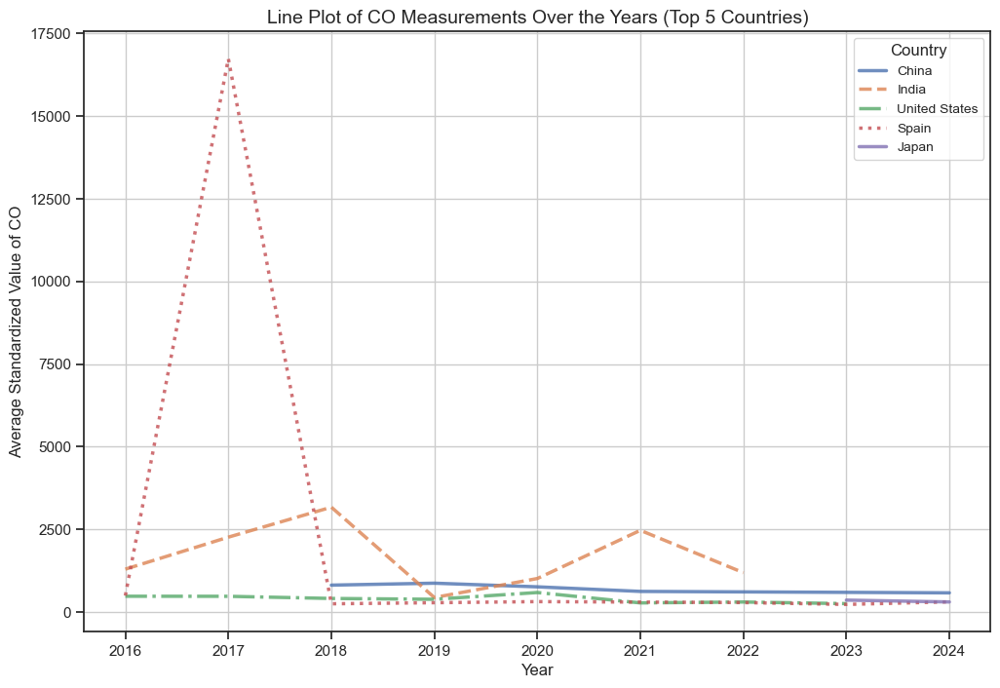

In [1381]:
co_top_countries = df[df['Pollutant'] == 'CO']['Country Label'].value_counts().nlargest(5).index
line_styles = ['-', '--', '-.', ':', '-']
co_top_countries_data = df[(df['Pollutant'] == 'CO') & (df['Country Label'].isin(co_top_countries))]
grouped_data = co_top_countries_data.groupby(['Year', 'Country Label'])['Value_standard'].mean().reset_index()
plt.figure(figsize=(12, 8))
for i, country in enumerate(co_top_countries):
    country_data = grouped_data[grouped_data['Country Label'] == country]
    sns.lineplot(data=country_data, x='Year', y='Value_standard', label=country, linewidth=2.5, alpha=0.8, linestyle=line_styles[i])

plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Standardized Value of CO', fontsize=12)
plt.title('Line Plot of CO Measurements Over the Years (Top 5 Countries)', fontsize=14)
plt.legend(title="Country", title_fontsize='12', fontsize='10')
plt.grid(True)
plt.show()


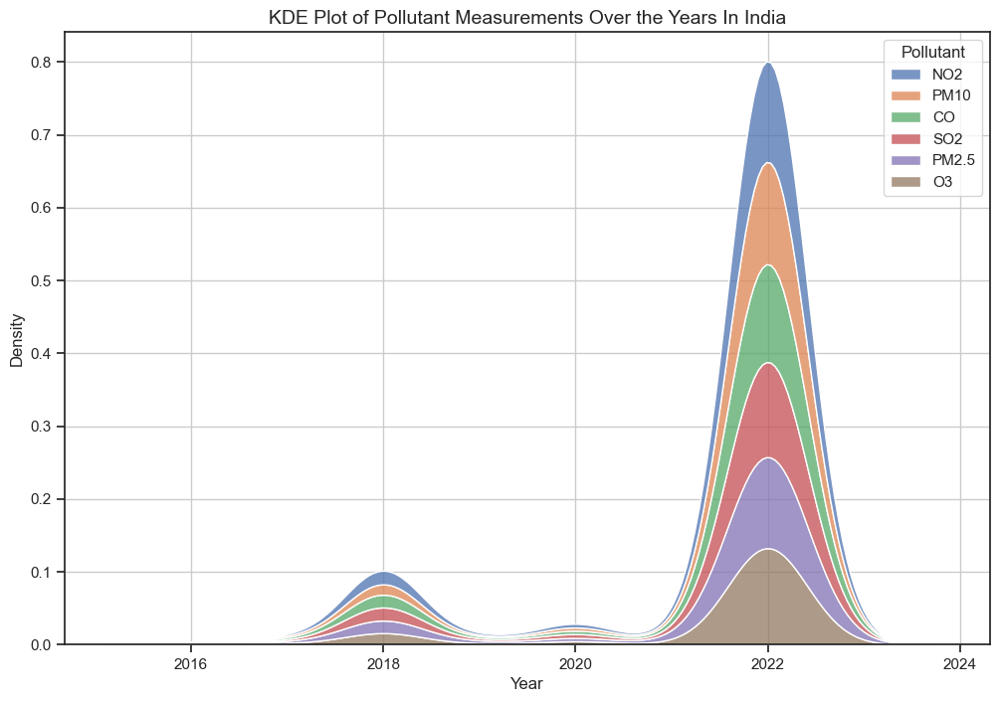

In [1382]:
kdedat = df[df['Country Label'] == 'India']
plt.figure(figsize=(12, 8))
sns.kdeplot(data=kdedat, x="Year", hue='Pollutant', multiple="stack")
plt.xlabel('Year', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.title('KDE Plot of Pollutant Measurements Over the Years In India', fontsize=14)
plt.grid(True)
plt.show()


In [1383]:
min_marker_size = 1
max_marker_size = 50
min_concentration = df['Value_standard'].min()
max_concentration = df['Value_standard'].max()
scaled_concentration = (df['Value_standard'] - min_concentration) / (max_concentration - min_concentration)
scaled_concentration = scaled_concentration * (max_marker_size - min_marker_size) + min_marker_size
color_map = {"Good": "green", "Regular": "yellow", "Bad": "red"}
fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude",
                        color="Quality",
                        size=scaled_concentration,
                        hover_name="Pollutant", 
                        hover_data=["Value_standard"],
                        color_discrete_map=color_map,
                        range_color=(min_concentration, max_concentration),
                        zoom=10)

fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})

fig.show()


In [1384]:
import dash
from dash import dcc, html, Output
import plotly.express as px
newtop5 = df[df['Country Label'].isin(df['Country Label'].value_counts().head(10).index)]
newtop5p = newtop5[newtop5['Pollutant'].isin(newtop5['Pollutant'].value_counts().head(5).index)]
default_country = newtop5['Country Label'].iloc[0]
country_dropdown_options = [{'label': country, 'value': country} for country in newtop5['Country Label'].unique()]
app = dash.Dash(__name__)
app.layout = html.Div([
    html.H1("Interactive Polar Line Plot with Dropdown Menus"),
    html.Div([
        dcc.Dropdown(
            id='country-dropdown',
            options=country_dropdown_options,
            value=default_country
        ),
    ], style={'width': '50%', 'display': 'inline-block'}),
    dcc.Graph(id='plot')
])

@app.callback(
    Output('plot', 'figure'),
    [Input('country-dropdown', 'value')]
)
def update_graph(selected_country):
    filtered_data = newtop5p[newtop5p['Country Label'] == selected_country]
    
    fig = px.line_polar(filtered_data, r='Value_standard', theta='Pollutant', line_close=True, color='Pollutant')
    fig.update_traces(fill='toself')
    
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


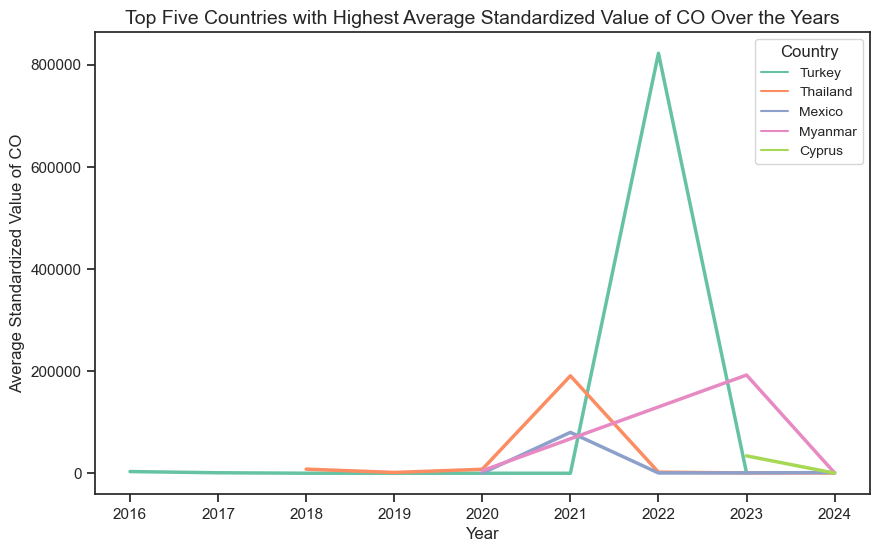

In [1385]:
co_data = df[df['Pollutant'] == 'CO']
grouped_data = co_data.groupby(['Year', 'Country Label'])['Value_standard'].mean().reset_index()
top_countries = grouped_data.groupby('Country Label')['Value_standard'].mean().nlargest(5).index
filtered_data = grouped_data[grouped_data['Country Label'].isin(top_countries)]
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_data, x='Year', y='Value_standard', hue='Country Label', palette='Set2', linewidth=2.5)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Standardized Value of CO', fontsize=12)
plt.title('Top Five Countries with Highest Average Standardized Value of CO Over the Years', fontsize=14)
plt.legend(title="Country", title_fontsize='12', fontsize='10')
plt.show()


In [1386]:
#All above are the graphes the in the PDF from here its thos who are not made the cut

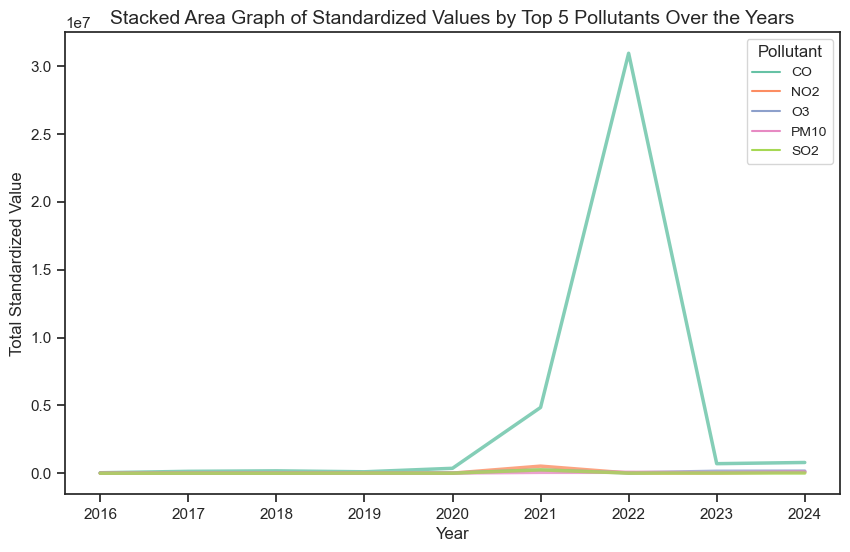

In [1387]:
grouped_data = df.groupby(['Year', 'Pollutant'])['Value_standard'].sum().reset_index()
top_pollutants = grouped_data.groupby('Pollutant')['Value_standard'].sum().nlargest(5).index
filtered_data = grouped_data[grouped_data['Pollutant'].isin(top_pollutants)]
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_data, x='Year', y='Value_standard', hue='Pollutant', palette='Set2', linewidth=2.5, alpha=0.8)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Standardized Value', fontsize=12)
plt.title('Stacked Area Graph of Standardized Values by Top 5 Pollutants Over the Years', fontsize=14)
plt.legend(title="Pollutant", title_fontsize='12', fontsize='10')
plt.show()

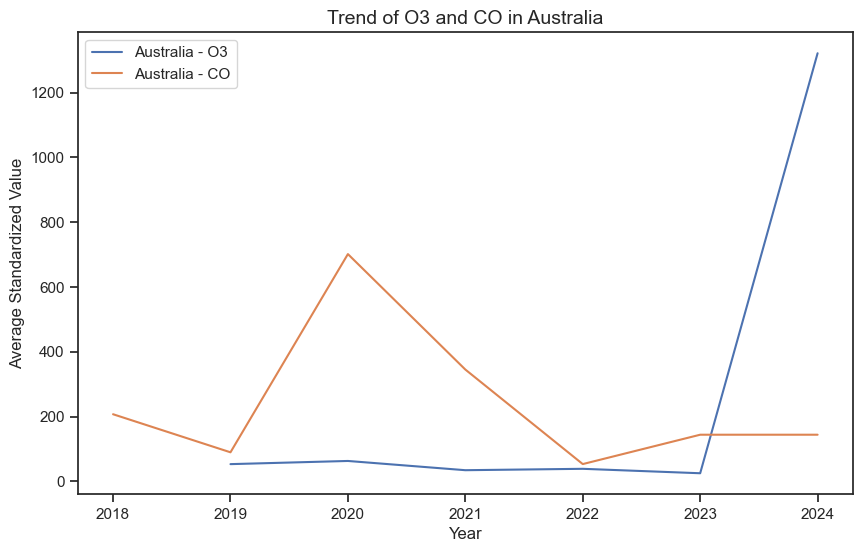

In [1388]:
aus_data = df[df['Country Label'].isin(['Australia'])]
o3_co_data = aus_nz_data[aus_nz_data['Pollutant'].isin(['O3', 'CO'])]
grouped_data = o3_co_data.groupby(['Year', 'Country Label', 'Pollutant'])['Value_standard'].mean().reset_index()
plt.figure(figsize=(10, 6))
for country in ['Australia']:
    for pollutant in ['O3', 'CO']:
        data = grouped_data[(grouped_data['Country Label'] == country) & (grouped_data['Pollutant'] == pollutant)]
        plt.plot(data['Year'], data['Value_standard'], label=f'{country} - {pollutant}')

plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Standardized Value', fontsize=12)
plt.title('Trend of O3 and CO in Australia', fontsize=14)
plt.legend()
plt.show()


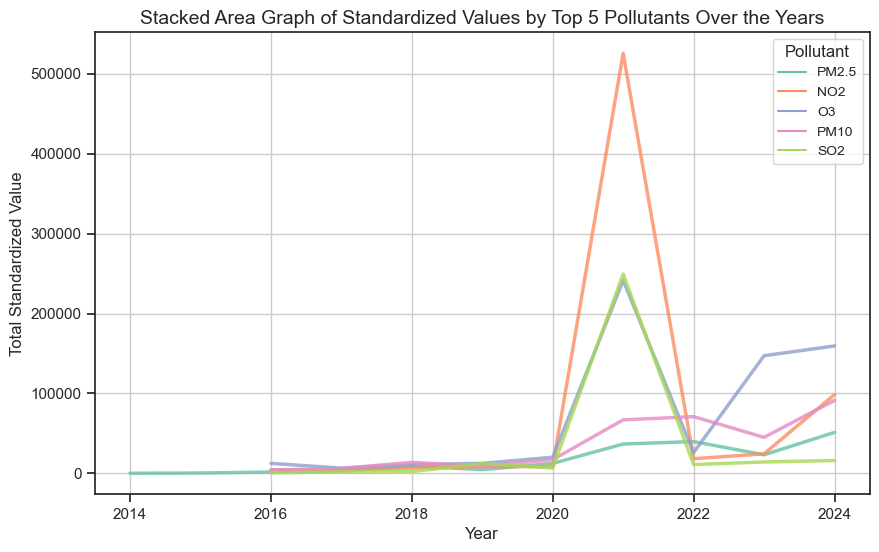

In [1389]:
pollutant_counts = df['Pollutant'].value_counts()
top_pollutants = pollutant_counts.nlargest(5).index
filtered_data = df[df['Pollutant'].isin(top_pollutants)]
grouped_data = filtered_data.groupby(['Year', 'Pollutant'])['Value_standard'].sum().reset_index()
plt.figure(figsize=(10, 6))
sns.lineplot(data=grouped_data, x='Year', y='Value_standard', hue='Pollutant', palette='Set2', linewidth=2.5, alpha=0.8)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Standardized Value', fontsize=12)
plt.title('Stacked Area Graph of Standardized Values by Top 5 Pollutants Over the Years', fontsize=14)
plt.legend(title="Pollutant", title_fontsize='12', fontsize='10')
plt.grid(True)
plt.show()


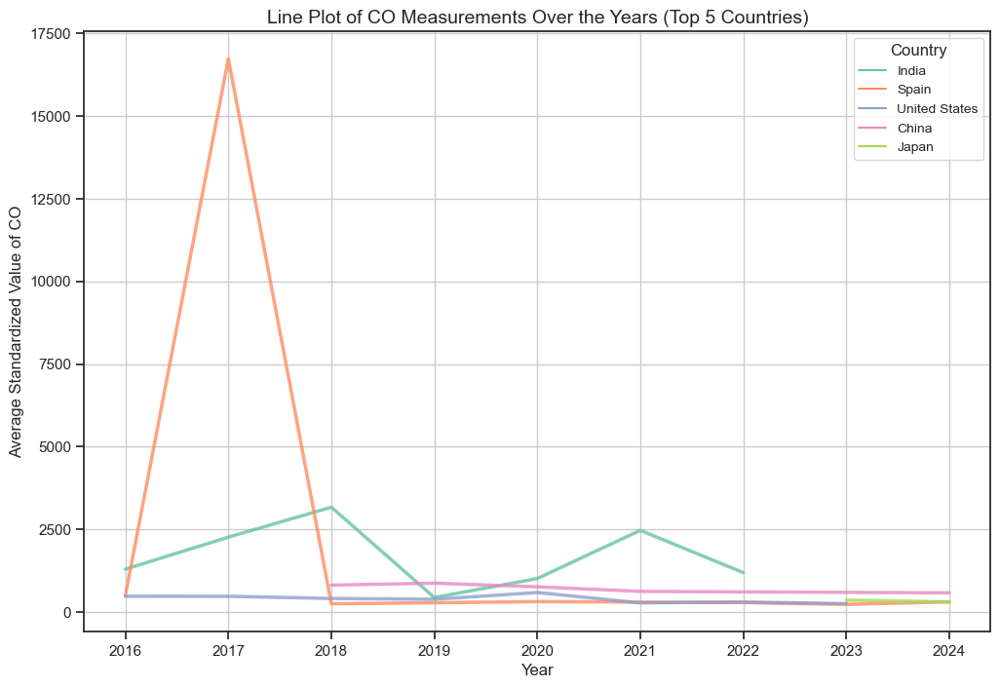

In [1390]:
co_top_countries = df[df['Pollutant'] == 'CO']['Country Label'].value_counts().nlargest(5).index
co_top_countries_data = df[(df['Pollutant'] == 'CO') & (df['Country Label'].isin(co_top_countries))]
grouped_data = co_top_countries_data.groupby(['Year', 'Country Label'])['Value_standard'].mean().reset_index()
plt.figure(figsize=(12, 8))
sns.lineplot(data=grouped_data, x='Year', y='Value_standard', hue='Country Label', palette='Set2', linewidth=2.5, alpha=0.8)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Standardized Value of CO', fontsize=12)
plt.title('Line Plot of CO Measurements Over the Years (Top 5 Countries)', fontsize=14)
plt.legend(title="Country", title_fontsize='12', fontsize='10')
plt.grid(True)
plt.show()


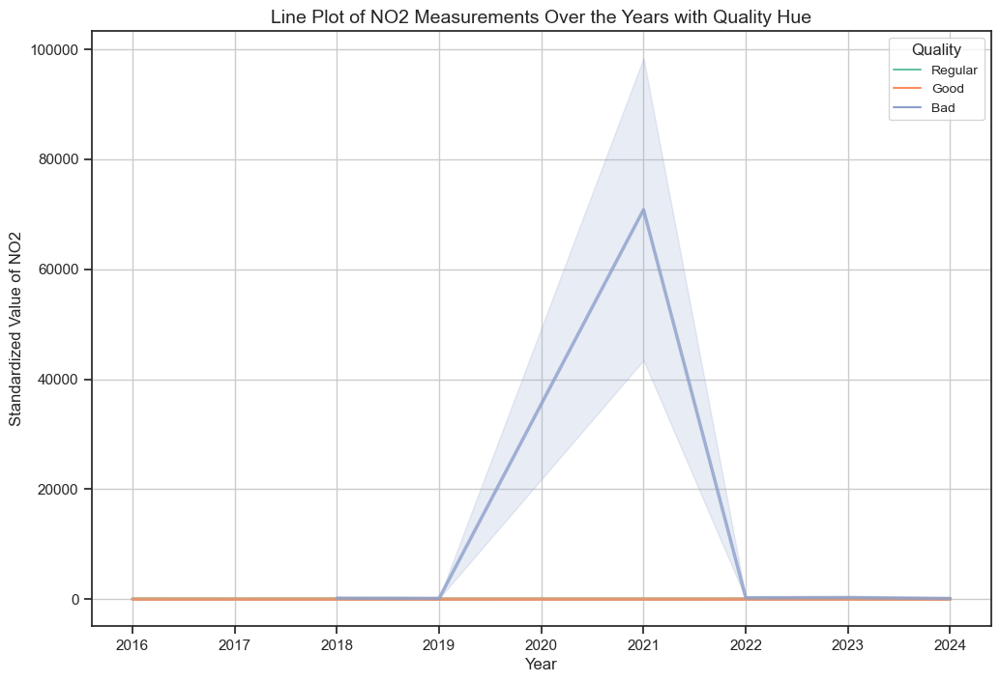

In [1391]:
no2_data = df[df['Pollutant'] == 'NO2']
plt.figure(figsize=(12, 8))
sns.lineplot(data=no2_data, x='Year', y='Value_standard', hue='Quality', palette='Set2', linewidth=2.5, alpha=0.8)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Standardized Value of NO2', fontsize=12)
plt.title('Line Plot of NO2 Measurements Over the Years with Quality Hue', fontsize=14)
plt.legend(title="Quality", title_fontsize='12', fontsize='10')
plt.grid(True)
plt.show()


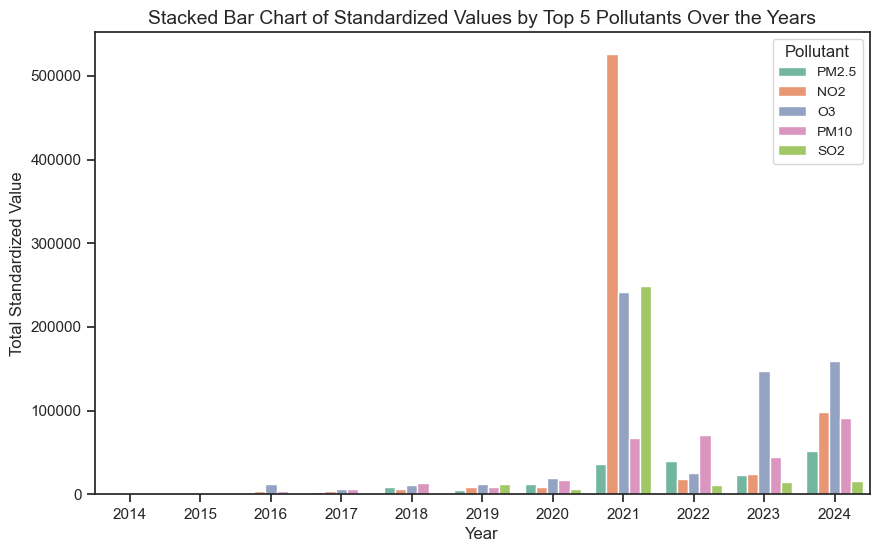

In [1392]:
pollutant_counts = df['Pollutant'].value_counts()
top_pollutants = pollutant_counts.nlargest(5).index
filtered_data = df[df['Pollutant'].isin(top_pollutants)]
grouped_data = filtered_data.groupby(['Year', 'Pollutant'])['Value_standard'].sum().reset_index()
plt.figure(figsize=(10, 6))
sns.barplot(data=grouped_data, x='Year', y='Value_standard', hue='Pollutant', palette='Set2')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Standardized Value', fontsize=12)
plt.title('Stacked Bar Chart of Standardized Values by Top 5 Pollutants Over the Years', fontsize=14)
plt.legend(title="Pollutant", title_fontsize='12', fontsize='10')
plt.show()


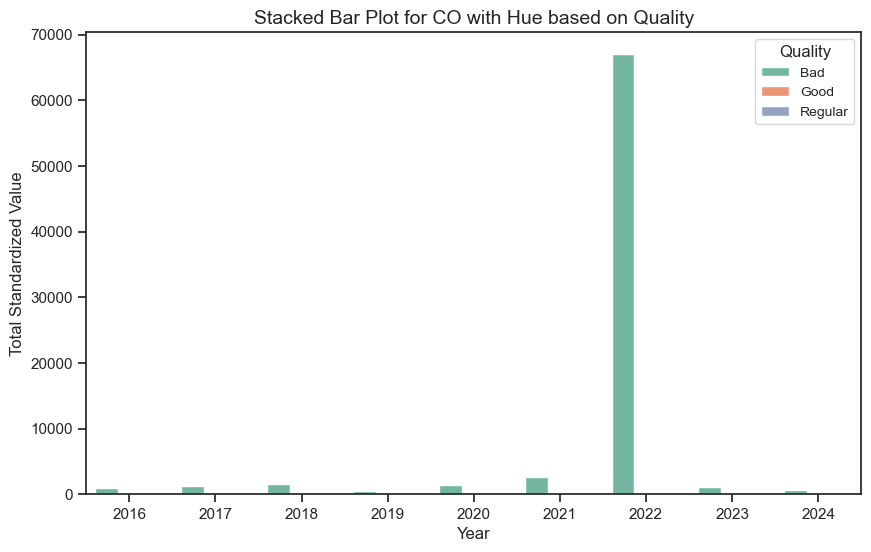

In [1393]:
co_data = df[df['Pollutant'] == 'CO']
plt.figure(figsize=(10, 6))
sns.barplot(data=co_data, x='Year', y='Value_standard', hue='Quality', palette='Set2', ci=None)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Standardized Value', fontsize=12)
plt.title('Stacked Bar Plot for CO with Hue based on Quality', fontsize=14)
plt.legend(title="Quality", title_fontsize='12', fontsize='10')
plt.show()


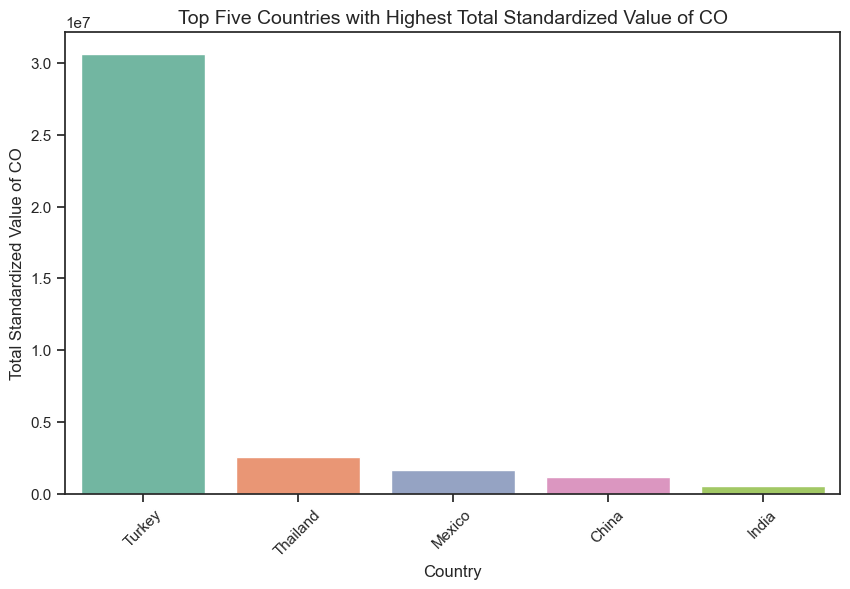

In [1394]:
grouped_data = df[df['Pollutant'] == 'CO'].groupby('Country Label')['Value_standard'].sum().reset_index()
top_countries = grouped_data.nlargest(5, 'Value_standard')
plt.figure(figsize=(10, 6))
sns.barplot(data=top_countries, x='Country Label', y='Value_standard', palette='Set2')
plt.xlabel('Country', fontsize=12)
plt.ylabel('Total Standardized Value of CO', fontsize=12)
plt.title('Top Five Countries with Highest Total Standardized Value of CO', fontsize=14)
plt.xticks(rotation=45)
plt.show()


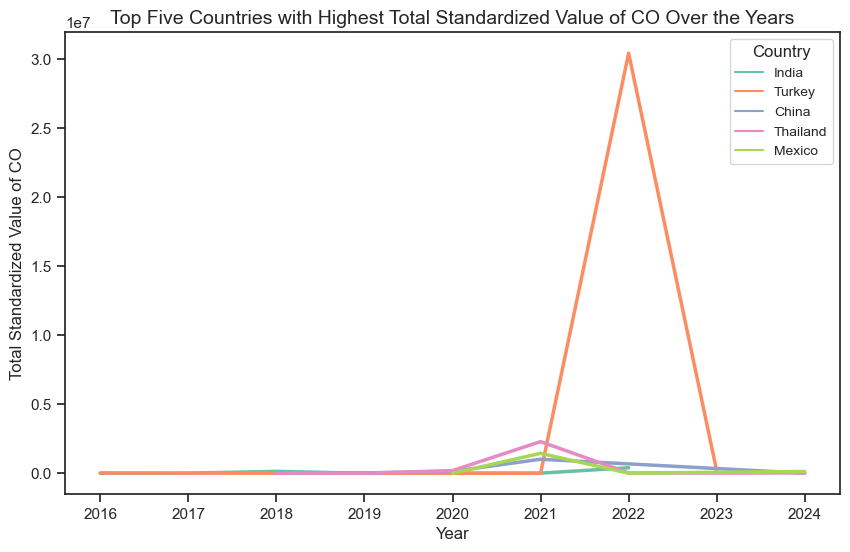

In [1395]:
co_data = df[df['Pollutant'] == 'CO']
grouped_data = co_data.groupby(['Year', 'Country Label'])['Value_standard'].sum().reset_index()
top_countries = grouped_data.groupby('Country Label')['Value_standard'].sum().nlargest(5).index
filtered_data = grouped_data[grouped_data['Country Label'].isin(top_countries)]
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_data, x='Year', y='Value_standard', hue='Country Label', palette='Set2', linewidth=2.5)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Standardized Value of CO', fontsize=12)
plt.title('Top Five Countries with Highest Total Standardized Value of CO Over the Years', fontsize=14)
plt.legend(title="Country", title_fontsize='12', fontsize='10')
plt.show()
